In [ ]:
# Cell 1 - Install packages
!pip install -q ultralytics pycocotools tqdm

# Vérifier GPU
import torch, os
print("torch cuda available:", torch.cuda.is_available())
print("cuda device count:", torch.cuda.device_count())
if torch.cuda.is_available():
    print("Device name:", torch.cuda.get_device_name(0))
else:
    print("No GPU detected — active un GPU via Runtime -> Change runtime type -> GPU")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.8 MB/s eta 0:00:00
torch cuda available: True
cuda device count: 1
Device name: Tesla T4


In [ ]:
# Cell 2 - Classes et chemins
classes_custom = [
    'ashcan', 'bicycle', 'blind_road', 'bus', 'car', 'crosswalk', 'dog',
    'fire_hydrant', 'green_light', 'motorcycle', 'person', 'pole', 'red_light',
    'reflective_cone', 'roadblock', 'sign', 'tree', 'tricycle', 'truck', 'warning_column'
]

inhouse_classes = [
    "chair", "couch", "potted plant", "bed", "dining table", "toilet",
    "tv", "laptop", "microwave", "oven", "toaster", "sink", "refrigerator",
    "book", "clock", "vase"
]

# Fusion propre (dataset_small d'abord, puis inhouse qui ne sont pas déjà présentes)
all_classes = classes_custom + [c for c in inhouse_classes if c not in classes_custom]
print(f"Total classes merged: {len(all_classes)}")
print(all_classes)

# Chemins de travail
BASE = "/content"
COCO_DIR = f"{BASE}/coco"
DATASET_SMALL = f"{BASE}/dataset_small"   # si tu uploades ici ou montes Drive
FUSED = f"{BASE}/dataset_fused"
os.makedirs(COCO_DIR, exist_ok=True)
os.makedirs(FUSED, exist_ok=True)


Total classes merged: 36
['ashcan', 'bicycle', 'blind_road', 'bus', 'car', 'crosswalk', 'dog', 'fire_hydrant', 'green_light', 'motorcycle', 'person', 'pole', 'red_light', 'reflective_cone', 'roadblock', 'sign', 'tree', 'tricycle', 'truck', 'warning_column', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase']


In [ ]:
# Vérifier doublons exacts
from collections import Counter
counts = Counter(all_classes)
dupes = [cls for cls, cnt in counts.items() if cnt > 1]
print("Doublons détectés :", dupes)


Doublons détectés : []


In [ ]:
# Cell 4 - subset COCO filtré sur classes sélectionnées
import os, json, random

BASE = "/content"
COCO_DIR = f"{BASE}/coco"
subset_dir = f"{COCO_DIR}/train2017_filtered"
os.makedirs(subset_dir, exist_ok=True)

# Charger annotations
ann_file = f"{COCO_DIR}/annotations/instances_train2017.json"
with open(ann_file, "r") as f:
    coco_ann = json.load(f)

# Créer mapping id → nom
coco_cats = {c['id']: c['name'] for c in coco_ann['categories']}

# Trouver les IDs des classes que tu veux
wanted_ids = [cid for cid, name in coco_cats.items() if name in inhouse_classes]
print("IDs des classes filtrées :", wanted_ids)

# Collecter images contenant au moins une de ces classes
img_ids = set()
for ann in coco_ann['annotations']:
    if ann['category_id'] in wanted_ids:
        img_ids.add(ann['image_id'])

print(f"Nombre total d'images contenant les classes sélectionnées: {len(img_ids)}")

# Créer la liste d'images à télécharger (subset si trop grand)
subset_n = min(500, len(img_ids))  # max 500 images pour test rapide
subset_ids = random.sample(list(img_ids), subset_n)  # convert set → list
print(f"Téléchargement d'un subset de {len(subset_ids)} images.")

# Télécharger images
base_img_url = "http://images.cocodataset.org/train2017/"
for img_id in subset_ids:
    fname = next(img['file_name'] for img in coco_ann['images'] if img['id'] == img_id)
    outp = os.path.join(subset_dir, fname)
    if not os.path.exists(outp):
        !wget -q -nc $base_img_url$fname -O $outp

print(f"Subset COCO filtré prêt dans {subset_dir} ({len(os.listdir(subset_dir))} images).")


IDs des classes filtrées : [62, 63, 64, 65, 67, 70, 72, 73, 78, 79, 80, 81, 82, 84, 85, 86]
Nombre total d'images contenant les classes sélectionnées: 41078
Téléchargement d'un subset de 500 images.
Subset COCO filtré prêt dans /content/coco/train2017_filtered (500 images).


In [ ]:
# Cell 5 - Convertir COCO subset en format YOLO pour fusion
import os, json, shutil, tqdm

BASE = "/content"
COCO_DIR = f"{BASE}/coco"
SUBSET_DIR = f"{COCO_DIR}/train2017_filtered"

YOLO_DIR = f"{BASE}/coco_yolo"
IMG_DIR = os.path.join(YOLO_DIR, "images")
LABEL_DIR = os.path.join(YOLO_DIR, "labels")
os.makedirs(IMG_DIR, exist_ok=True)
os.makedirs(LABEL_DIR, exist_ok=True)

# Charger annotations COCO
ann_file = f"{COCO_DIR}/annotations/instances_train2017.json"
with open(ann_file, "r") as f:
    coco_ann = json.load(f)

# Mapping id → nom
coco_cats = {c['id']: c['name'] for c in coco_ann['categories']}

# IDs des classes que l’on garde
wanted_ids = [cid for cid, name in coco_cats.items() if name in inhouse_classes]

# Créer mapping nom → new_id (index dans all_classes)
name2newid = {name: idx for idx, name in enumerate(all_classes)}

# Images subset
img_infos = {img['id']: img for img in coco_ann['images']}

# Conversion COCO → YOLO
print("Conversion COCO → YOLO...")
for ann in tqdm.tqdm(coco_ann['annotations']):
    if ann['category_id'] not in wanted_ids:
        continue
    img_id = ann['image_id']
    img_info = img_infos[img_id]
    fname = img_info['file_name']
    src_img = os.path.join(SUBSET_DIR, fname)
    if not os.path.exists(src_img):
        continue
    # Copier l'image dans YOLO_DIR/images
    dst_img = os.path.join(IMG_DIR, fname)
    if not os.path.exists(dst_img):
        shutil.copy(src_img, dst_img)

    # Convert bbox COCO -> YOLO normalized
    x, y, w, h = ann['bbox']
    xc = (x + w/2) / img_info['width']
    yc = (y + h/2) / img_info['height']
    w /= img_info['width']
    h /= img_info['height']

    cname = coco_cats[ann['category_id']]
    new_id = name2newid[cname]

    label_path = os.path.join(LABEL_DIR, os.path.splitext(fname)[0] + ".txt")
    with open(label_path, "a") as f:
        f.write(f"{new_id} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}\n")

print(f"Conversion terminée. Images: {len(os.listdir(IMG_DIR))}, Labels: {len(os.listdir(LABEL_DIR))}")


Conversion COCO → YOLO...


100%|██████████| 860001/860001 [00:01<00:00, 691877.67it/s]

Conversion terminée. Images: 500, Labels: 500


In [ ]:
# Cell 6 - Upload dataset_small via Colab UI et fusion avec COCO YOLO
import os, shutil
from google.colab import files

BASE = "/content"
DATASET_SMALL = f"{BASE}/dataset_small"
FUSED = f"{BASE}/dataset_fused"
os.makedirs(FUSED, exist_ok=True)

# ----- OPTION A : Upload dataset_small zip depuis PC -----
print("Sélectionne le fichier dataset_small.zip à uploader...")
uploaded = files.upload()  # upload via Colab UI

# Décompresser le zip
for fname in uploaded.keys():
    print(f"Décompression de {fname}...")
    !unzip -q {fname} -d {DATASET_SMALL}

# Vérification dataset_small
if os.path.exists(DATASET_SMALL):
    print("dataset_small prêt :", os.listdir(DATASET_SMALL)[:5])
else:
    print("dataset_small non trouvé !")


Sélectionne le fichier dataset_small.zip à uploader...


Saving dataset_small.zip to dataset_small.zip
Décompression de dataset_small.zip...
dataset_small prêt : ['dataset_small']


In [ ]:
# Correction du chemin : le zip contient un sous-dossier 'dataset_small'
small_base = os.path.join(DATASET_SMALL, "dataset_small")
small_train_img_dir = os.path.join(small_base, "train/images")
small_train_label_dir = os.path.join(small_base, "train/labels")

print("Images train dataset_small :", len(os.listdir(small_train_img_dir)))
print("Labels train dataset_small :", len(os.listdir(small_train_label_dir)))

# ----- Fusion avec COCO YOLO subset -----
FUSED_IMG_DIR = os.path.join(FUSED, "train/images")
FUSED_LABEL_DIR = os.path.join(FUSED, "train/labels")
os.makedirs(FUSED_IMG_DIR, exist_ok=True)
os.makedirs(FUSED_LABEL_DIR, exist_ok=True)

# Copier COCO YOLO subset
shutil.copytree(os.path.join(COCO_YOLO_DIR, "images"), FUSED_IMG_DIR, dirs_exist_ok=True)
shutil.copytree(os.path.join(COCO_YOLO_DIR, "labels"), FUSED_LABEL_DIR, dirs_exist_ok=True)

# Copier dataset_small corrigé
shutil.copytree(small_train_img_dir, FUSED_IMG_DIR, dirs_exist_ok=True)
shutil.copytree(small_train_label_dir, FUSED_LABEL_DIR, dirs_exist_ok=True)

print(f"Fusion terminée. Images totales : {len(os.listdir(FUSED_IMG_DIR))}, Labels totaux : {len(os.listdir(FUSED_LABEL_DIR))}")

# ----- Création data_fused.yaml pour YOLOv8 -----
data_yaml = {
    'train': FUSED_IMG_DIR,
    'val': FUSED_IMG_DIR,  # pour test rapide, sinon séparer train/val
    'names': all_classes
}

yaml_file = os.path.join(FUSED, "data_fused.yaml")
with open(yaml_file, "w") as f:
    yaml.dump(data_yaml, f)

print(f"data_fused.yaml créé : {yaml_file}")

Images train dataset_small : 1397
Labels train dataset_small : 1397
Fusion terminée. Images totales : 1897, Labels totaux : 1897
data_fused.yaml créé : /content/dataset_fused/data_fused.yaml


In [ ]:
import os
import random
from PIL import Image

FUSED_IMG_DIR = "/content/dataset_fused/train/images"
FUSED_LABEL_DIR = "/content/dataset_fused/train/labels"

# 1️⃣ Nombre total d'images et labels
num_images = len(os.listdir(FUSED_IMG_DIR))
num_labels = len(os.listdir(FUSED_LABEL_DIR))
print(f"Total images : {num_images}, total labels : {num_labels}")

# 2️⃣ Vérifier que chaque image a un label correspondant
img_files = set(os.listdir(FUSED_IMG_DIR))
label_files = set(os.listdir(FUSED_LABEL_DIR))

missing_labels = [img for img in img_files if os.path.splitext(img)[0] + ".txt" not in label_files]
missing_images = [lbl for lbl in label_files if os.path.splitext(lbl)[0] + ".jpg" not in img_files and os.path.splitext(lbl)[0] + ".png" not in img_files]

print(f"Images sans label : {len(missing_labels)}")
print(f"Labels sans image : {len(missing_images)}")

# 3️⃣ Vérifier quelques labels et images
sample_imgs = random.sample(list(img_files), min(5, len(img_files)))
for img_name in sample_imgs:
    img_path = os.path.join(FUSED_IMG_DIR, img_name)
    lbl_path = os.path.join(FUSED_LABEL_DIR, os.path.splitext(img_name)[0] + ".txt")
    print(f"\nImage: {img_name}, Label: {lbl_path}")
    if os.path.exists(lbl_path):
        with open(lbl_path, "r") as f:
            lines = f.readlines()
        print("Contenu label:", lines)
    # Afficher l'image
    img = Image.open(img_path)
    img.show()


Total images : 1897, total labels : 1897
Images sans label : 0
Labels sans image : 0

Image: 20012397_jpg.rf.98c9df1a3fa2a052ad9663a2fe50f136.jpg, Label: /content/dataset_fused/train/labels/20012397_jpg.rf.98c9df1a3fa2a052ad9663a2fe50f136.txt
Contenu label: ['19 0.075 0.35703125 0.0140625 0.065625\n', '19 0.08046875 0.365625 0.01015625 0.0546875\n', '19 0.096875 0.36875 0.015625 0.053125\n', '19 0.1203125 0.340625 0.0171875 0.09453125\n', '19 0.253125 0.37109375 0.009375 0.0578125\n', '19 0.26328125 0.3484375 0.0125 0.0515625\n', '19 0.48828125 0.3625 0.009375 0.0515625\n', '19 0.440625 0.346875 0.009375 0.0484375\n', '19 0.41875 0.3296875 0.009375 0.02890625\n', '19 0.35390625 0.325 0.009375 0.02890625\n', '1 0.30078125 0.32265625 0.03046875 0.03359375\n', '10 0.16640625 0.325 0.0171875 0.053125\n', '10 0.49296875 0.31875 0.015625 0.02578125\n', '9 0.16640625 0.3328125 0.05 0.03828125\n', '11 0.10625 0.14453125 0.02734375 0.2890625\n', '11 0.23828125 0.190625 0.03203125 0.38046875\n',

In [ ]:
import os
from collections import Counter

FUSED_LABEL_DIR = "/content/dataset_fused/train/labels"

# Compter toutes les classes présentes
class_counts = Counter()

for lbl_file in os.listdir(FUSED_LABEL_DIR):
    lbl_path = os.path.join(FUSED_LABEL_DIR, lbl_file)
    with open(lbl_path, "r") as f:
        lines = f.readlines()
        for line in lines:
            cls_id = int(line.split()[0])
            class_counts[cls_id] += 1

# Afficher toutes les classes présentes
print("Classe ID : nombre d’objets (toutes classes)")
for cls_id, count in sorted(class_counts.items()):
    print(f"{cls_id} ({all_classes[cls_id]}): {count}")


Classe ID : nombre d’objets (toutes classes)
0 (ashcan): 321
1 (bicycle): 569
2 (blind_road): 219
3 (bus): 178
4 (car): 2658
5 (crosswalk): 819
6 (dog): 93
7 (fire_hydrant): 119
8 (green_light): 477
9 (motorcycle): 1142
10 (person): 3495
11 (pole): 2993
12 (red_light): 423
13 (reflective_cone): 422
14 (roadblock): 433
15 (sign): 311
16 (tree): 2266
17 (tricycle): 151
18 (truck): 346
19 (warning_column): 1034
20 (chair): 490
21 (couch): 76
22 (potted plant): 109
23 (bed): 50
24 (dining table): 204
25 (toilet): 38
26 (tv): 77
27 (laptop): 46
28 (microwave): 16
29 (oven): 46
30 (toaster): 3
31 (sink): 68
32 (refrigerator): 25
33 (book): 299
34 (clock): 64
35 (vase): 88


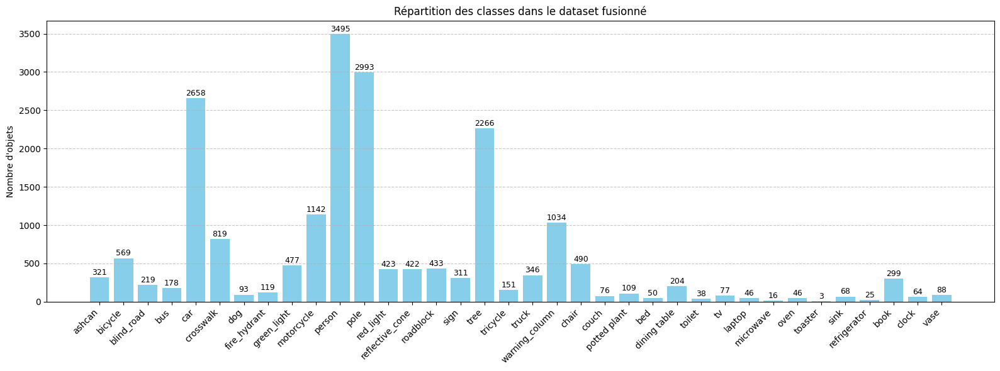

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter
import os

FUSED_LABEL_DIR = "/content/dataset_fused/train/labels"

# Compter toutes les classes
class_counts = Counter()
for lbl_file in os.listdir(FUSED_LABEL_DIR):
    lbl_path = os.path.join(FUSED_LABEL_DIR, lbl_file)
    with open(lbl_path) as f:
        for line in f:
            cls_id = int(line.split()[0])
            class_counts[cls_id] += 1

# Préparer données pour l'histogramme
ids = sorted(class_counts.keys())
counts = [class_counts[i] for i in ids]
names = [all_classes[i] for i in ids]

# Créer figure
plt.figure(figsize=(16,6))
bars = plt.bar(range(len(ids)), counts, color='skyblue')
plt.xticks(range(len(ids)), names, rotation=45, ha='right')
plt.ylabel("Nombre d'objets")
plt.title("Répartition des classes dans le dataset fusionné")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Afficher les nombres au-dessus des barres
for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10, str(count), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


In [ ]:
# Cell 7 - Entraîner YOLOv8 et télécharger le modèle
!pip install ultralytics --quiet

from ultralytics import YOLO
import os
from google.colab import files

FUSED = "/content/dataset_fused"
data_yaml = os.path.join(FUSED, "data_fused.yaml")

# ----- Entraînement YOLOv8 -----
# model='yolov8n.pt' : nano, rapide pour test
model = YOLO("yolov8n.pt")

print("Démarrage de l'entraînement YOLOv8...")
results = model.train(
    data=data_yaml,
    epochs=50,          # change selon besoin
    imgsz=640,
    batch=16,
    name="yolov8_fused"
)

# ----- Télécharger le modèle entraîné -----
# Le checkpoint final sera dans /content/runs/detect/yolov8_fused
model_dir = "/content/runs/detect/yolov8_fused"
weights_file = os.path.join(model_dir, "weights", "best.pt")

if os.path.exists(weights_file):
    print(f"Téléchargement du modèle {weights_file} ...")
    files.download(weights_file)
else:
    print("Fichier best.pt non trouvé, vérifie le chemin :", weights_file)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Démarrage de l'entraînement YOLOv8...
Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset_fused/data_fused.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hs

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Modèle chargé : /content/runs/detect/yolov8_fused/weights/best.pt
Sélectionne une image pour le test...


Saving rue.webp to rue (2).webp
Image sélectionnée : rue (2).webp

image 1/1 /content/rue (2).webp: 480x640 3 cars, 1 crosswalk, 2 persons, 3 poles, 5 warning_columns, 6.7ms
Speed: 1.6ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict12
Prédiction terminée.
Image avec détections :


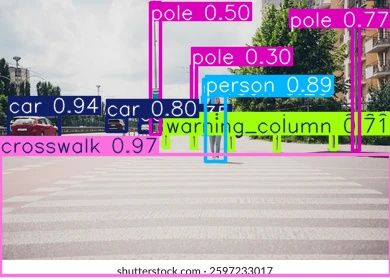

In [ ]:
from ultralytics import YOLO
from google.colab import files
from IPython.display import Image, display
import os

# ----- Charger le modèle entraîné -----
model_path = "/content/runs/detect/yolov8_fused/weights/best.pt"
if not os.path.exists(model_path):
    print("Le fichier best.pt n'existe pas. Vérifie l'entraînement.")
else:
    model = YOLO(model_path)
    print("Modèle chargé :", model_path)

    # ----- Upload d'une image depuis ton PC -----
    print("Sélectionne une image pour le test...")
    uploaded = files.upload()

    # Prendre le premier fichier uploadé
    img_file = list(uploaded.keys())[0]
    print("Image sélectionnée :", img_file)

    # ----- Prédiction -----
    results = model.predict(img_file, conf=0.25, save=True)
    print("Prédiction terminée.")

    # ----- Affichage du résultat -----
    pred_dir = "/content/runs/detect/predict"  # <-- chemin correct
    output_img = sorted(os.listdir(pred_dir))[-1]
    output_path = os.path.join(pred_dir, output_img)

    print("Image avec détections :")
    display(Image(output_path))


Modèle chargé : /content/runs/detect/yolov8_fused/weights/best.pt
Sélectionne une image pour le test...


Saving projet-amenagement-interieur-exterieur-maison_734629-309.jpg to projet-amenagement-interieur-exterieur-maison_734629-309 (1).jpg
Image sélectionnée : projet-amenagement-interieur-exterieur-maison_734629-309 (1).jpg

image 1/1 /content/projet-amenagement-interieur-exterieur-maison_734629-309 (1).jpg: 384x640 1 pole, 6 chairs, 2 couchs, 2 potted plants, 2 tvs, 8.1ms
Speed: 1.9ms preprocess, 8.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict16
Prédiction terminée.
Image annotée sauvegardée : /content/runs/detect/predict16/projet-amenagement-interieur-exterieur-maison_734629-309 (1).jpg


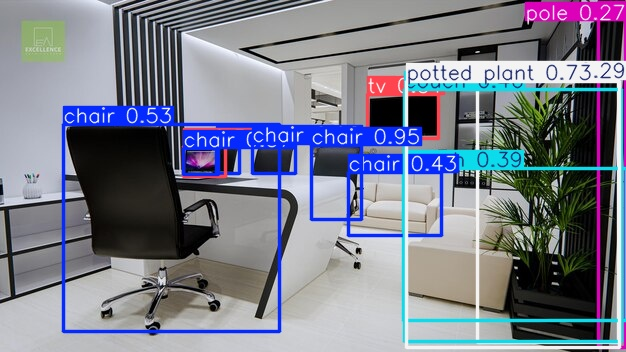

In [ ]:
from ultralytics import YOLO
from google.colab import files
from IPython.display import Image, display
import os
import glob

# Charger le modèle
model_path = "/content/runs/detect/yolov8_fused/weights/best.pt"
if not os.path.exists(model_path):
    print("Le fichier best.pt n'existe pas.")
else:
    model = YOLO(model_path)
    print("Modèle chargé :", model_path)

    # ----- Upload d'une nouvelle image -----
    print("Sélectionne une image pour le test...")
    uploaded = files.upload()
    img_file = list(uploaded.keys())[0]
    print("Image sélectionnée :", img_file)

    # ----- Prédiction -----
    results = model.predict(img_file, conf=0.25, save=True)
    print("Prédiction terminée.")

    # ----- Chercher le dernier dossier predict créé -----
    base_dir = "/content/runs/detect"
    predict_dirs = sorted(glob.glob(os.path.join(base_dir, "predict*")), key=os.path.getmtime)
    if not predict_dirs:
        print("Erreur : aucun dossier predict trouvé.")
    else:
        latest_dir = predict_dirs[-1]  # dernier dossier créé
        # chercher toutes les images (jpg, png) générées
        img_files = glob.glob(os.path.join(latest_dir, "*.jpg")) + glob.glob(os.path.join(latest_dir, "*.png"))
        if not img_files:
            print("Erreur : aucune image annotée trouvée dans", latest_dir)
        else:
            output_path = sorted(img_files, key=os.path.getmtime)[-1]  # dernière image créée
            print("Image annotée sauvegardée :", output_path)

            # ----- Affichage de l'image -----
            display(Image(output_path))



In [ ]:
from ultralytics import YOLO
from google.colab import files
from IPython.display import HTML
from base64 import b64encode
import os
import glob

# Charger le modèle
model_path = "/content/runs/detect/yolov8_fused/weights/best.pt"
if not os.path.exists(model_path):
    print("Le fichier best.pt n'existe pas.")
else:
    model = YOLO(model_path)
    print("Modèle chargé :", model_path)

    # ----- Upload de la vidéo -----
    print("Sélectionne une vidéo pour le test...")
    uploaded = files.upload()
    video_file = list(uploaded.keys())[0]
    print("Vidéo sélectionnée :", video_file)

    # ----- Prédiction sur la vidéo -----
    results = model.predict(video_file, conf=0.25, save=True)
    print("Prédiction terminée.")

    # ----- Chercher le dernier dossier predict créé -----
    base_dir = "/content/runs/detect"
    predict_dirs = sorted(glob.glob(os.path.join(base_dir, "predict*")), key=os.path.getmtime)
    if not predict_dirs:
        print("Erreur : aucun dossier predict trouvé.")
    else:
        latest_dir = predict_dirs[-1]  # dernier dossier créé

        # Chercher toutes les vidéos dans ce dossier
        video_files = []
        for ext in ["*.mp4", "*.avi", "*.mov"]:
            video_files.extend(glob.glob(os.path.join(latest_dir, ext)))

        if not video_files:
            print("Erreur : aucune vidéo annotée trouvée dans", latest_dir)
        else:
            # Prendre la vidéo la plus récente
            output_path = sorted(video_files, key=os.path.getmtime)[-1]
            print("Vidéo annotée sauvegardée :", output_path)

            # ----- Affichage de la vidéo dans Colab -----
            mp4_encoded = b64encode(open(output_path, 'rb').read()).decode('ascii')
            display(HTML(f"""
            <video width=640 controls>
                <source src="data:video/mp4;base64,{mp4_encoded}" type="video/mp4">
            </video>
            """))


Modèle chargé : /content/runs/detect/yolov8_fused/weights/best.pt
Sélectionne une vidéo pour le test...


Saving 1101-143052492_small.mp4 to 1101-143052492_small (5).mp4
Vidéo sélectionnée : 1101-143052492_small (5).mp4

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/248) /content/1101-143052492_small (5).mp4: 384x640 (no detections), 8.7ms
video 1/1 (frame 2/248) /content/1101-143052492_small (5).mp4: 384x640 (no detections), 6.2ms
video 1/1 (frame 3/248) /content/1101-143052492_small (5).mp4: 384x640 (no detections), 5.9ms
video 1/1 (frame 4/248) /content/1101-143052492_small (5).mp

In [ ]:
from ultralytics import YOLO
import os
from google.colab import files

# Chemin du modèle déjà entraîné
prev_model_path = "/content/runs/detect/yolov8_fused/weights/best.pt"
if not os.path.exists(prev_model_path):
    print("Le fichier best.pt n'existe pas.")
else:
    # Charger le modèle
    model = YOLO(prev_model_path)
    print("Modèle chargé :", prev_model_path)

    # ----- Entraînement supplémentaire (nouveau cycle) -----
    FUSED = "/content/dataset_fused"
    data_yaml = os.path.join(FUSED, "data_fused.yaml")
    new_run_name = "yolov8_fused_extra"  # nouveau nom pour éviter les conflits

    results = model.train(
        data=data_yaml,
        epochs=50,       # nombre d'epochs supplémentaires
        imgsz=640,
        batch=16,
        name=new_run_name,
        resume=False     # NE PAS résumer, recommencer à partir du modèle actuel
    )

    # ----- Télécharger le nouveau modèle -----
    model_dir = f"/content/runs/detect/{new_run_name}"
    weights_file = os.path.join(model_dir, "weights", "best.pt")

    if os.path.exists(weights_file):
        print(f"Téléchargement du modèle {weights_file} ...")
        files.download(weights_file)
    else:
        print("Fichier best.pt non trouvé après le nouvel entraînement :", weights_file)


Modèle chargé : /content/runs/detect/yolov8_fused/weights/best.pt
Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset_fused/data_fused.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/yolov8_fused/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_fused_extra, nbs

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow

# Chemin vers le nouveau modèle
new_model_path = "/content/runs/detect/yolov8_fused_extra/weights/best.pt"

# Charger le modèle
model = YOLO(new_model_path)
print("Modèle chargé :", new_model_path)


Modèle chargé : /content/runs/detect/yolov8_fused_extra/weights/best.pt


In [ ]:
from google.colab import files

# Ouvre un dialogue pour uploader un fichier
uploaded = files.upload()

# Récupérer le nom du fichier uploadé
for filename in uploaded.keys():
    test_image = "/content/" + filename
    print("Image uploadée :", test_image)


Saving maison.webp to maison (4).webp
Image uploadée : /content/maison (4).webp



image 1/1 /content/maison (4).webp: 448x640 1 chair, 1 couch, 1 tv, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


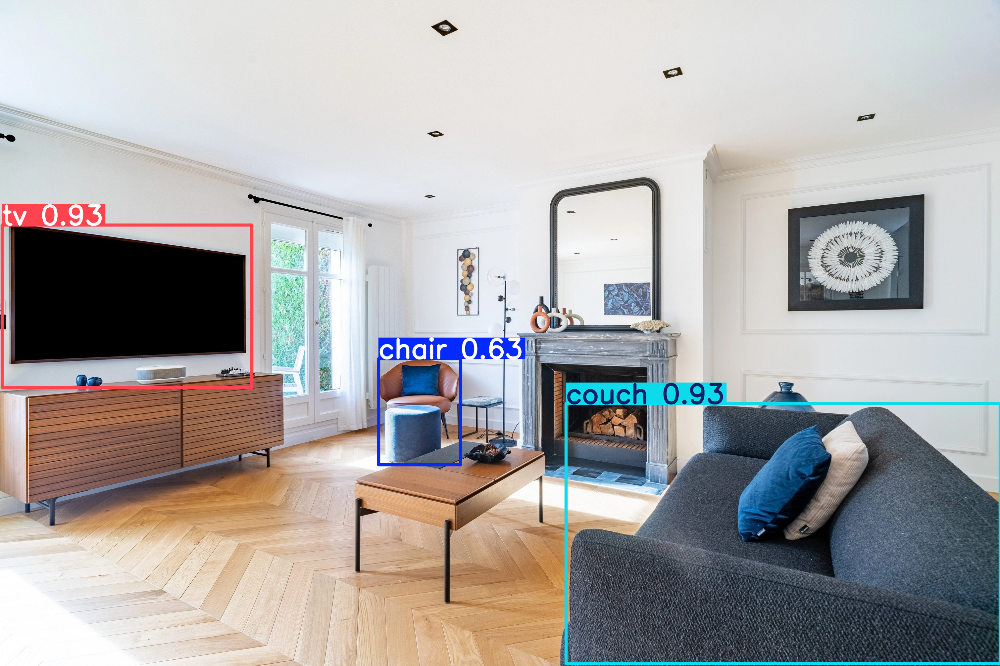

In [ ]:
# Faire la détection
results = model.predict(source=test_image, conf=0.25, save=False)

# Afficher l'image avec les résultats
annotated_img = results[0].plot()
from google.colab.patches import cv2_imshow
cv2_imshow(annotated_img)


Affichage du graphique d'entraînement généré par YOLOv8 :


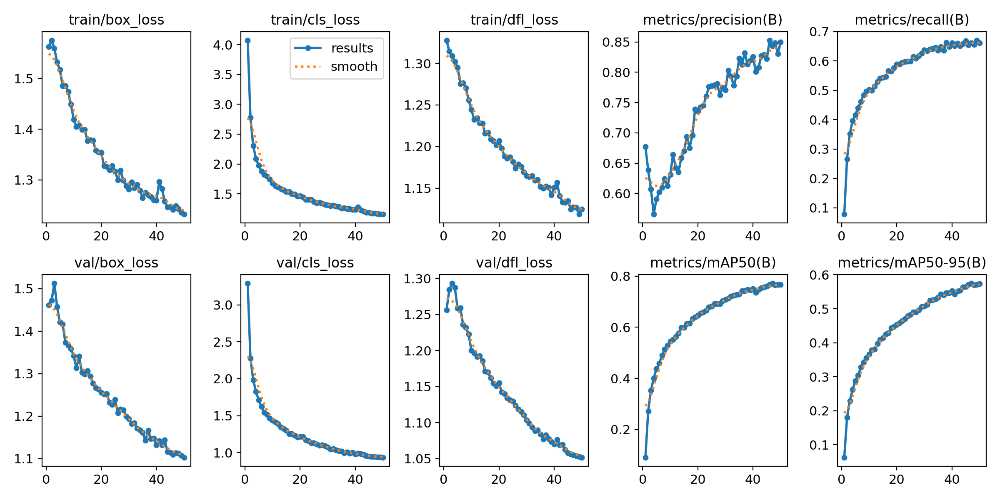

In [ ]:
import matplotlib.pyplot as plt
import os
import pandas as pd

# Chemin du run
run_dir = "/content/runs/detect/yolov8_fused"

# Vérifier si results.png existe
results_png = os.path.join(run_dir, "results.png")
if os.path.exists(results_png):
    from IPython.display import Image, display
    print("Affichage du graphique d'entraînement généré par YOLOv8 :")
    display(Image(results_png))
else:
    print("results.png non trouvé, on va tracer depuis metrics.csv...")

    # Lire metrics.csv
    metrics_csv = os.path.join(run_dir, "metrics.csv")
    if os.path.exists(metrics_csv):
        df = pd.read_csv(metrics_csv)
        plt.figure(figsize=(12,6))
        plt.plot(df['epoch'], df['train/loss'], label='Train Loss')
        plt.plot(df['epoch'], df['val/loss'], label='Val Loss')
        plt.plot(df['epoch'], df['metrics/mAP50'], label='mAP50')
        plt.plot(df['epoch'], df['metrics/mAP50-95'], label='mAP50-95')
        plt.xlabel("Epoch")
        plt.ylabel("Valeur")
        plt.title("Courbes d'entraînement YOLOv8")
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print("metrics.csv non trouvé non plus, impossible d'afficher les courbes.")


Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,012,668 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1224.3±366.0 MB/s, size: 63.4 KB)
val: Scanning /content/dataset_fused/train/labels.cache... 1897 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1897/1897 2.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 119/119 6.0it/s 19.8s
                   all       1897      20168      0.835       0.76      0.837      0.641
                ashcan        253        321      0.848      0.779      0.854      0.678
               bicycle        291        569      0.666       0.62       0.69      0.428
            blind_road        169        219        0.9       0.89      0.936       0.77
                   bus        138        178      0.829      0.736      0.818      0.638
                   car        716     

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
45,46,2210.99,1.16775,0.96066,1.08227,0.86644,0.73246,0.83943,0.64053,1.04272,0.81025,1.01254,0.000027,0.000027,0.000027
46,47,2256.54,1.17726,0.96848,1.08666,0.87118,0.73238,0.83896,0.64081,1.03971,0.80746,1.01084,0.000022,0.000022,0.000022
47,48,2303.14,1.17834,0.96418,1.08724,0.81251,0.77564,0.84056,0.64299,1.04003,0.80318,1.00878,0.000017,0.000017,0.000017
48,49,2350.76,1.17417,0.95791,1.08039,0.86960,0.73695,0.83991,0.64156,1.03470,0.80202,1.00728,0.000012,0.000012,0.000012
49,50,2397.17,1.16978,0.96137,1.08568,0.82909,0.76128,0.84018,0.64350,1.03060,0.79998,1.00607,0.000007,0.000007,0.000007


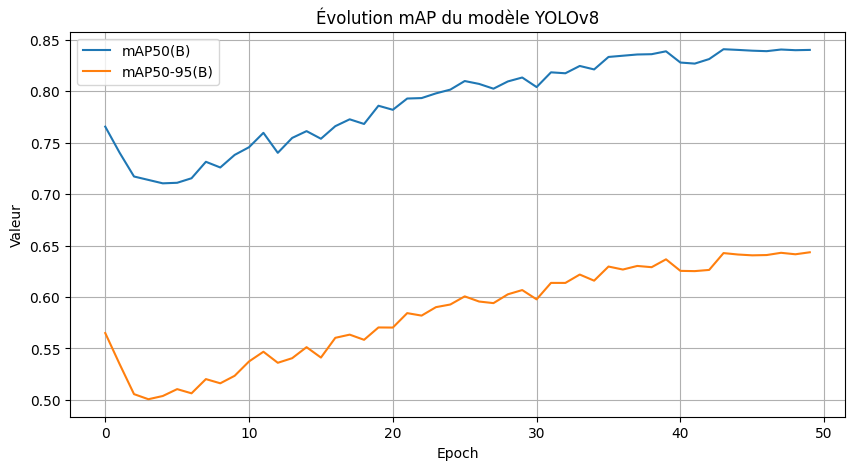

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Chemin vers le run
run_dir = "/content/runs/detect/yolov8_fused_extra"

# Charger le modèle (best.pt)
model_path = run_dir + "/weights/best.pt"
model = YOLO(model_path)

# Résumé des métriques du dernier entraînement
summary = model.val()  # évalue sur le dataset de validation

# Afficher le résumé
print(summary)

# Si tu veux extraire les mAP par epoch depuis l'historique de l'entraînement
import pandas as pd
import os

# Résultat du run contient souvent results.csv
results_csv = os.path.join(run_dir, "results.csv")
if os.path.exists(results_csv):
    df = pd.read_csv(results_csv)
    print("📌 Dernières epochs enregistrées :")
    display(df.tail())

    # Visualisation mAP
    plt.figure(figsize=(10,5))
    if "metrics/mAP50(B)" in df.columns:
        plt.plot(df["metrics/mAP50(B)"], label="mAP50(B)")
    if "metrics/mAP50-95(B)" in df.columns:
        plt.plot(df["metrics/mAP50-95(B)"], label="mAP50-95(B)")
    plt.xlabel("Epoch")
    plt.ylabel("Valeur")
    plt.title("Évolution mAP du modèle YOLOv8")
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("⚠️ Aucun fichier results.csv trouvé dans le run. Tu peux utiliser `model.val()` pour voir les métriques actuelles.")


In [ ]:
from ultralytics import YOLO
from google.colab import files
import os

# Chemin vers ton modèle déjà entraîné
prev_model_path = "/content/runs/detect/yolov8_fused_extra/weights/best.pt"

if not os.path.exists(prev_model_path):
    print("⚠️ Le fichier best.pt n'existe pas. Vérifie le chemin.")
else:
    # Charger le modèle (poids pré-entraînés)
    model = YOLO(prev_model_path)
    print("Modèle chargé :", prev_model_path)

    # ----- Nouvel entraînement (10 epochs supplémentaires) -----
    FUSED = "/content/dataset_fused"
    data_yaml = os.path.join(FUSED, "data_fused.yaml")
    new_run_name = "yolov8_fused_extra_more10"

    results = model.train(
        data=data_yaml,
        epochs=10,
        imgsz=640,
        batch=16,
        name=new_run_name,
        resume=False   # IMPORTANT : False, on part du best.pt existant comme poids de départ
    )

    # ----- Télécharger le nouveau modèle -----
    model_dir = f"/content/runs/detect/{new_run_name}"
    weights_file = os.path.join(model_dir, "weights", "best.pt")

    if os.path.exists(weights_file):
        print(f"Téléchargement du modèle {weights_file} ...")
        files.download(weights_file)
    else:
        print("⚠️ Fichier best.pt non trouvé après l'entraînement :", weights_file)


Modèle chargé : /content/runs/detect/yolov8_fused_extra/weights/best.pt
Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset_fused/data_fused.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/yolov8_fused_extra/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_fuse